# Competitive Adsorption Model Analysis

This notebook implements various competitive adsorption models and analyzes their performance in fitting experimental data. The models included are:
- Langmuir
- Flory
- Fowler
- Hill-Deboer

## 1. Import Required Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize, root
from scipy.stats import linregress
import warnings
warnings.filterwarnings('ignore')

## 2. Define Constants

In [2]:
R = 8.314  # J mol‑1 K‑1
T = 298.0  # K

## 3. Define Competitive Adsorption Models

In [3]:
def competitive_langmuir(C_acid, C_fa, KA, KF):
    """Competitive Langmuir model"""
    C_acid = np.asarray(C_acid)
    C_fa = np.asarray(C_fa)
    denominator = 1 + KA * C_acid + KF * C_fa
    thetaA = (KA * C_acid) / denominator
    thetaF = (KF * C_fa) / denominator
    return thetaA, thetaF

def competitive_flory(C_acid, C_fa, KA, KF, rA, rF):
    """Competitive Flory model"""
    C_acid = np.asarray(C_acid)
    C_fa = np.asarray(C_fa)
    thetaA = np.zeros_like(C_acid)
    thetaF = np.zeros_like(C_fa)
    
    for i in range(len(C_acid)):
        def eqs(vars):
            thetaA_i, thetaF_i = vars
            thetaT = thetaA_i + thetaF_i
            return [
                thetaA_i / (1 - thetaT) ** rA - KA * C_acid[i],
                thetaF_i / (1 - thetaT) ** rF - KF * C_fa[i],
            ]
        
        guess = competitive_langmuir(C_acid[i], C_fa[i], KA, KF)
        sol = root(eqs, guess, tol=1e-12)
        if not sol.success:
            raise RuntimeError("Flory solver failed")
        thetaA[i], thetaF[i] = sol.x
    
    return thetaA, thetaF

def competitive_fowler(C_acid, C_fa, KA, KF, wAA, wFF, wAF):
    """Competitive Fowler model"""
    C_acid = np.asarray(C_acid)
    C_fa = np.asarray(C_fa)
    thetaA = np.zeros_like(C_acid)
    thetaF = np.zeros_like(C_fa)
    
    for i in range(len(C_acid)):
        def eqs(vars):
            thetaA_i, thetaF_i = vars
            thetaT = thetaA_i + thetaF_i
            common = lambda th1, th2, w11, w12: th1 / (1 - thetaT) * np.exp(
                -(w11 * th1 + w12 * th2) * 1000.0 / (R * T)
            )
            return [
                common(thetaA_i, thetaF_i, wAA, wAF) - KA * C_acid[i],
                common(thetaF_i, thetaA_i, wFF, wAF) - KF * C_fa[i],
            ]
        
        sol = root(eqs, competitive_langmuir(C_acid[i], C_fa[i], KA, KF), tol=1e-12)
        if not sol.success:
            raise RuntimeError("Fowler solver failed")
        thetaA[i], thetaF[i] = sol.x
    
    return thetaA, thetaF

def competitive_hill_deboer(C_acid, C_fa, KA, KF, a):
    """Competitive Hill-Deboer model"""
    C_acid = np.asarray(C_acid)
    C_fa = np.asarray(C_fa)
    thetaA = np.zeros_like(C_acid)
    thetaF = np.zeros_like(C_fa)
    
    for i in range(len(C_acid)):
        def eqs(vars):
            thetaA_i, thetaF_i = vars
            thetaT = thetaA_i + thetaF_i
            return [
                thetaA_i / (1 - thetaT) * np.exp(a * thetaT) - KA * C_acid[i],
                thetaF_i / (1 - thetaT) * np.exp(a * thetaT) - KF * C_fa[i],
            ]
        
        sol = root(eqs, competitive_langmuir(C_acid[i], C_fa[i], KA, KF), tol=1e-12)
        if not sol.success:
            raise RuntimeError("Hill-Deboer solver failed")
        thetaA[i], thetaF[i] = sol.x
    
    return thetaA, thetaF

## 4. Define Objective Function for Parameter Fitting

In [4]:
def objective_function(params, model_name, acid_data):
    total_error = 0
    for condition in acid_data['Experiment'].unique():
        subset = acid_data[acid_data['Experiment'] == condition]
        C_acid = subset['Acid conc (mM)'].values
        q_acid = subset['acid/SBU'].values/6
        C_fa = subset['FA conc (mM)'].values
        q_fa = subset['FA/SBU'].values/6
        
        try:
            if model_name == 'Langmuir':
                KA, KF = params
                thetaA, thetaF = competitive_langmuir(C_acid, C_fa, KA, KF)
            elif model_name == 'Flory':
                KA, KF, rA, rF = params
                thetaA, thetaF = competitive_flory(C_acid, C_fa, KA, KF, rA, rF)
            elif model_name == 'Fowler':
                KA, KF, wAA, wFF, wAF = params
                thetaA, thetaF = competitive_fowler(C_acid, C_fa, KA, KF, wAA, wFF, wAF)
            elif model_name == 'Hill-Deboer':
                KA, KF, a = params
                thetaA, thetaF = competitive_hill_deboer(C_acid, C_fa, KA, KF, a)
            
            # Calculate error
            error_acid = np.sum((q_acid - thetaA) ** 2)
            error_fa = np.sum((q_fa - thetaF) ** 2)
            total_error += error_acid + error_fa
            
        except Exception as e:
            print(f"Error in {model_name} fitting: {str(e)}")
            return np.inf
    
    return total_error

## 5. Load and Process Data

In [5]:
df = pd.read_csv("MOL_surface_adsorption_250427.csv")
df["Acid"] = df["Acid"].replace("HAC", "HAc")
print("Data shape:", df.shape)
print("\nFirst few rows:")
print(df.head())

Data shape: (137, 6)

First few rows:
  Acid Experiment  Acid conc (mM)  FA conc (mM)  acid/SBU  FA/SBU
0  TFA     acidic           180.0          45.0      3.02    0.38
1  TFA     acidic           135.0          90.0      2.88    0.48
2  TFA     acidic           112.5         112.5      2.86    0.44
3  TFA     acidic            90.0         135.0      2.96    0.56
4  TFA     acidic            45.0         180.0      2.76    0.70


## 6. Fit Parameters for Each Model and Acid

In [6]:
from scipy.optimize import differential_evolution
# Define models to fit
models = ['Langmuir', 'Flory', 'Fowler', 'Hill-Deboer']

# Fit Parameters for Each Model and Acid, separated by pH condition
fitted_params = {}
acids = df['Acid'].unique()

for acid in acids:
    acid_data = df[df['Acid'] == acid]
    fitted_params[acid] = {}
    
    # Separate data by pH condition
    conditions = acid_data['Experiment'].unique()
    
    for condition in conditions:
        condition_data = acid_data[acid_data['Experiment'] == condition]
        fitted_params[acid][condition] = {}
        
        print(f"\nFitting models for {acid} under {condition} conditions")
        
        for model_name in models:
            print(f"Fitting {model_name} for {acid} ({condition})")
            
            # Define parameter bounds for each model
            if model_name == 'Langmuir':
                bounds = [(0.001, 100.0), (0.001, 100.0)]  # KA, KF
                param_names = ['KA', 'KF']
            elif model_name == 'Flory':
                bounds = [(0.001, 100.0), (0.001, 100.0), (0.1, 10.0), (0.1, 10.0)]  # KA, KF, rA, rF
                param_names = ['KA', 'KF', 'rA', 'rF']
            elif model_name == 'Fowler':
                bounds = [(0.001, 100.0), (0.001, 100.0), (-10.0, 10.0), (-10.0, 10.0), (-10.0, 10.0)]  # KA, KF, wAA, wFF, wAF
                param_names = ['KA', 'KF', 'wAA', 'wFF', 'wAF']
            elif model_name == 'Hill-Deboer':
                bounds = [(0.001, 100.0), (0.001, 100.0), (-10.0, 10.0)]  # KA, KF, a
                param_names = ['KA', 'KF', 'a']
            
            # Define GA optimization function
            def ga_optimization(max_iter=20):
                
                # Use differential evolution (a type of genetic algorithm)
                result = differential_evolution(
                    objective_function,
                    bounds,
                    args=(model_name, condition_data),
                    maxiter=max_iter,
                    popsize=10,
                    tol=0.01,
                    mutation=(0.5, 1.0),
                    recombination=0.7,
                    disp=True
                )
                
                return result
            
            try:
                # Run GA optimization with initial 20 iterations
                result = ga_optimization(max_iter=20)
                
                # If not successful, try with 200 iterations
                if not result.success or result.fun == np.inf:
                    print(f"Initial optimization did not converge for {model_name}. Extending to 200 iterations...")
                    result = ga_optimization(max_iter=200)
                
                if result.success:
                    fitted_params[acid][condition][model_name] = result.x
                    print(f"Successfully fitted {model_name} for {acid} ({condition})")
                    print(f"Best parameters: {', '.join([f'{name}={val:.4f}' for name, val in zip(param_names, result.x)])}")
                    print(f"Objective function value: {result.fun:.6f}")
                else:
                    print(f"Warning: Optimization may not have converged for {model_name} ({acid}, {condition})")
                    print(f"Using best parameters found: {result.x}")
                    fitted_params[acid][condition][model_name] = result.x
            except Exception as e:
                print(f"Error fitting {model_name} for {acid} ({condition}): {str(e)}")
                fitted_params[acid][condition][model_name] = None


Fitting models for TFA under acidic conditions
Fitting Langmuir for TFA (acidic)
differential_evolution step 1: f(x)= 0.69205
differential_evolution step 2: f(x)= 0.69205
differential_evolution step 3: f(x)= 0.69205
differential_evolution step 4: f(x)= 0.69205
differential_evolution step 5: f(x)= 0.69205
differential_evolution step 6: f(x)= 0.69205
Polishing solution with 'L-BFGS-B'
Successfully fitted Langmuir for TFA (acidic)
Best parameters: KA=88.4204, KF=24.0745
Objective function value: 0.692047
Fitting Flory for TFA (acidic)
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fitting: Flory solver failed
Error in Flory fittin

## 7. Plot Results

Error plotting Flory for TFA (basic): Flory solver failed
Error plotting Fowler for TFA (acidic): Fowler solver failed
Error plotting Fowler for TFA (basic): Fowler solver failed
Error plotting Hill-Deboer for TFA (acidic): Hill-Deboer solver failed
Error plotting Hill-Deboer for TFA (basic): Hill-Deboer solver failed
Error plotting Flory for TA (basic): Flory solver failed
Error plotting Fowler for TA (acidic): Fowler solver failed
Error plotting Hill-Deboer for TA (acidic): Hill-Deboer solver failed
Error plotting Hill-Deboer for TA (basic): Hill-Deboer solver failed
Error plotting Fowler for SA (acidic): Fowler solver failed
Error plotting Hill-Deboer for SA (acidic): Hill-Deboer solver failed
Error plotting Hill-Deboer for SA (basic): Hill-Deboer solver failed
Error plotting Flory for PA (acidic): Flory solver failed
Error plotting Fowler for PA (acidic): Fowler solver failed
Error plotting Hill-Deboer for PA (acidic): Hill-Deboer solver failed
Error plotting Fowler for NFA (acidic

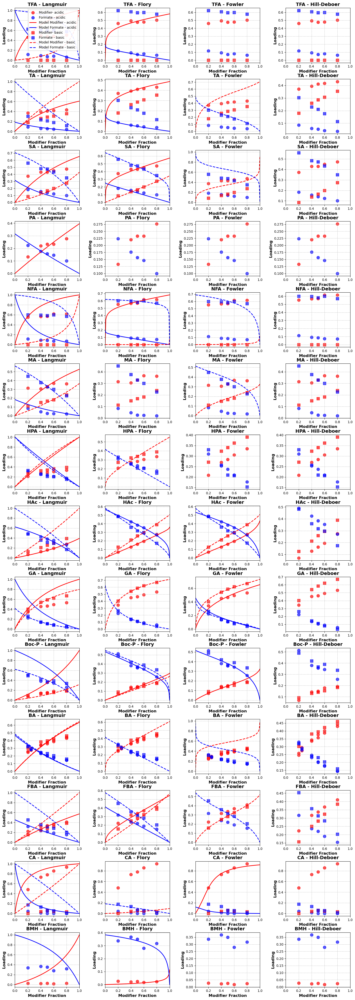

In [7]:
# Create a figure with multiple subplots - one row per acid, one column per model
fig, axes = plt.subplots(len(acids), len(models), figsize=(15, 3*len(acids)))
if len(acids) == 1:
    axes = axes.reshape(1, -1)

for i, acid in enumerate(acids):
    acid_data = df[df['Acid'] == acid]
    
    for j, model_name in enumerate(models):
        ax = axes[i, j]
        
        # Plot experimental data with clearer markers and colors
        # Use different marker styles for different experiments
        markers = ['o', 's', '^', 'D', 'v', '<', '>']
        for idx, condition in enumerate(acid_data['Experiment'].unique()):
            subset = acid_data[acid_data['Experiment'] == condition]
            marker = markers[idx % len(markers)]
            
            # Calculate total concentration (acid + FA) for each data point
            total_conc = subset['Acid conc (mM)'] + subset['FA conc (mM)']
            
            # Plot experimental data as a function of acid fraction
            acid_fraction = subset['Acid conc (mM)'] / total_conc
            acid_scatter = ax.scatter(acid_fraction, subset['acid/SBU']/6, 
                      c='red', marker=marker, s=80, alpha=0.7, 
                      label=f'Modifier- {condition}')
            fa_scatter = ax.scatter(acid_fraction, subset['FA/SBU']/6, 
                      c='blue', marker=marker, s=80, alpha=0.7,
                      label=f'Formate - {condition}')
            
            # Plot model predictions for each condition separately
            if model_name in fitted_params[acid][condition] and fitted_params[acid][condition][model_name] is not None:
                params = fitted_params[acid][condition][model_name]
                
                try:
                    # Get the average total concentration for this condition
                    avg_total_conc = total_conc.mean()
                    
                    # Create a range of acid fractions from 0 to 1
                    acid_frac_range = np.linspace(0, 1, 100)
                    
                    # Calculate corresponding acid and FA concentrations at constant total concentration
                    C_acid = acid_frac_range * avg_total_conc
                    C_fa = (1 - acid_frac_range) * avg_total_conc
                    
                    if model_name == 'Langmuir':
                        KA, KF = params
                        thetaA, thetaF = competitive_langmuir(C_acid, C_fa, KA, KF)
                    elif model_name == 'Flory':
                        KA, KF, rA, rF = params
                        thetaA, thetaF = competitive_flory(C_acid, C_fa, KA, KF, rA, rF)
                    elif model_name == 'Fowler':
                        KA, KF, wAA, wFF, wAF = params
                        thetaA, thetaF = competitive_fowler(C_acid, C_fa, KA, KF, wAA, wFF, wAF)
                    elif model_name == 'Hill-Deboer':
                        KA, KF, a = params
                        thetaA, thetaF = competitive_hill_deboer(C_acid, C_fa, KA, KF, a)
                    
                    # Use different line styles for different conditions
                    linestyle = '-' if idx % 2 == 0 else '--'
                    acid_line, = ax.plot(acid_frac_range, thetaA, 'r', linestyle=linestyle, linewidth=2, 
                           label=f'Model Modifier - {condition}')
                    fa_line, = ax.plot(acid_frac_range, thetaF, 'b', linestyle=linestyle, linewidth=2, 
                           label=f'Model Formate - {condition}')
                    
                except Exception as e:
                    print(f"Error plotting {model_name} for {acid} ({condition}): {str(e)}")
        
        # Improve axis labels and title
        ax.set_xlabel('Modifier Fraction', fontsize=12, fontweight='bold')
        ax.set_ylabel('Loading', fontsize=12, fontweight='bold')
        ax.set_title(f'{acid} - {model_name}', fontsize=14, fontweight='bold')
        ax.tick_params(axis='both', which='major', labelsize=10)
        ax.grid(True, linestyle='--', alpha=0.7)
        
        # Set x-axis limits from 0 to 1
        ax.set_xlim(0, 1)
        
        # Add legend to the last subplot of the first row
        if i == 0 and j == 0:
            ax.legend(loc='upper right', fontsize=10, framealpha=0.9)

# Adjust layout
plt.tight_layout()
plt.subplots_adjust(hspace=0.3, wspace=0.4)

## 8. Calculate and Display R² Values

In [8]:
# Calculate R² Values
r2_values = {}
for acid in acids:
    acid_data = df[df['Acid'] == acid]
    r2_values[acid] = {}
    
    # Group by experiment condition (acidic vs basic)
    for condition in acid_data['Experiment'].unique():
        condition_data = acid_data[acid_data['Experiment'] == condition]
        
        if condition not in r2_values[acid]:
            r2_values[acid][condition] = {}
        
        for model_name in models:
            if model_name in fitted_params[acid][condition] and fitted_params[acid][condition][model_name] is not None:
                params = fitted_params[acid][condition][model_name]
                
                try:
                    # Calculate model predictions
                    C_acid = condition_data['Acid conc (mM)'].values
                    C_fa = condition_data['FA conc (mM)'].values
                    
                    if model_name == 'Langmuir':
                        KA, KF = params
                        thetaA, thetaF = competitive_langmuir(C_acid, C_fa, KA, KF)
                    elif model_name == 'Flory':
                        KA, KF, rA, rF = params
                        thetaA, thetaF = competitive_flory(C_acid, C_fa, KA, KF, rA, rF)
                    elif model_name == 'Fowler':
                        KA, KF, wAA, wFF, wAF = params
                        thetaA, thetaF = competitive_fowler(C_acid, C_fa, KA, KF, wAA, wFF, wAF)
                    elif model_name == 'Hill-Deboer':
                        KA, KF, a = params
                        thetaA, thetaF = competitive_hill_deboer(C_acid, C_fa, KA, KF, a)
                    
                    # Calculate R² for acid and formate
                    r2_acid = 1 - np.sum((condition_data['acid/SBU']/6 - thetaA) ** 2) / np.sum((condition_data['acid/SBU']/6 - np.mean(condition_data['acid/SBU']/6)) ** 2)
                    r2_fa = 1 - np.sum((condition_data['FA/SBU']/6 - thetaF) ** 2) / np.sum((condition_data['FA/SBU']/6 - np.mean(condition_data['FA/SBU']/6)) ** 2)
                    
                    r2_values[acid][condition][model_name] = {'Acid': r2_acid, 'Formate': r2_fa}
                    
                except Exception as e:
                    print(f"Error calculating R² for {model_name} and {acid} ({condition}): {str(e)}")
                    r2_values[acid][condition][model_name] = None

# Print R² values
print("\nR² Values:")
for acid in acids:
    print(f"\n{acid}:")
    for condition in r2_values[acid]:
        print(f"\n  {condition} condition:")
        for model_name in models:
            if model_name in r2_values[acid][condition] and r2_values[acid][condition][model_name] is not None:
                print(f"    {model_name}:")
                print(f"      Acid R²: {r2_values[acid][condition][model_name]['Acid']:.2f}")
                print(f"      Formate R²: {r2_values[acid][condition][model_name]['Formate']:.2f}")


R² Values:

TFA:

  acidic condition:
    Langmuir:
      Acid R²: -422.12
      Formate R²: -132.68
    Flory:
      Acid R²: -4.71
      Formate R²: -0.19
    Fowler:
      Acid R²: -210.20
      Formate R²: -145.11
    Hill-Deboer:
      Acid R²: -11.07
      Formate R²: -4.10

  basic condition:
    Langmuir:
      Acid R²: -inf
      Formate R²: -322.88
    Flory:
      Acid R²: -inf
      Formate R²: 0.86
    Fowler:
      Acid R²: -inf
      Formate R²: -181.44
    Hill-Deboer:
      Acid R²: -inf
      Formate R²: -0.62

TA:

  acidic condition:
    Langmuir:
      Acid R²: -18.79
      Formate R²: -0.20
    Flory:
      Acid R²: -0.06
      Formate R²: 0.71
    Fowler:
      Acid R²: -165.16
      Formate R²: -254.70
    Hill-Deboer:
      Acid R²: -1.65
      Formate R²: -0.65

  basic condition:
    Langmuir:
      Acid R²: -26.67
      Formate R²: -19.68
    Flory:
      Acid R²: 0.64
      Formate R²: 0.80
    Fowler:
      Acid R²: -16.19
      Formate R²: 0.96
    Hill-

In [9]:
# Create a summary table of model parameters and R² values
summary_data = []

for acid in acids:
    for condition in fitted_params[acid]:
        for model_name in models:
            if model_name in fitted_params[acid][condition] and fitted_params[acid][condition][model_name] is not None:
                params = fitted_params[acid][condition][model_name]
                r2_vals = r2_values[acid][condition][model_name]
                
                # Extract parameters based on model type
                if model_name == 'Langmuir':
                    KA, KF = params
                    extra_params = "–"
                elif model_name == 'Flory':
                    KA, KF, rA, rF = params
                    extra_params = f"rA = {rA:.1f}, rF = {rF:.1f}"
                elif model_name == 'Fowler':
                    KA, KF, wAA, wFF, wAF = params
                    extra_params = f"wAA = {wAA:.1f}, wFF = {wFF:.1f}, wAF = {wAF:.1f}"
                elif model_name == 'Hill-Deboer':
                    KA, KF, a = params
                    extra_params = f"a = {a:.1f}"
                
                # Add row to summary data
                summary_data.append({
                    'Acid': acid,
                    'Condition': condition,
                    'Model': model_name,
                    'KA (mM⁻¹)': KA,
                    'KF (mM⁻¹)': KF,
                    'Extra Parameters': extra_params,
                    'R² (Acid)': round(r2_vals['Acid'], 2),
                    'R² (Formate)': round(r2_vals['Formate'], 2)
                })

# Create DataFrame and display
summary_df = pd.DataFrame(summary_data)

# Format the table for better readability
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.precision', 2)

# Display the summary table
print("\nModel Parameter and R² Summary:")
print(summary_df)



Model Parameter and R² Summary:
      Acid Condition        Model  KA (mM⁻¹)  KF (mM⁻¹)                      Extra Parameters  R² (Acid)  R² (Formate)
0      TFA    acidic     Langmuir   8.84e+01   2.41e+01                                     –    -422.12       -132.68
1      TFA    acidic        Flory   1.52e+01   1.00e-03                   rA = 10.0, rF = 0.6      -4.71         -0.19
2      TFA    acidic       Fowler   2.52e+01   3.17e+00     wAA = -3.1, wFF = -9.4, wAF = 9.8    -210.20       -145.11
3      TFA    acidic  Hill-Deboer   1.73e+00   1.30e-01                               a = 9.8     -11.07         -4.10
4      TFA     basic     Langmuir   8.93e+00   7.08e+01                                     –       -inf       -322.88
5      TFA     basic        Flory   1.00e-03   5.74e+01                   rA = 9.9, rF = 10.0       -inf          0.86
6      TFA     basic       Fowler   3.05e-01   8.77e+01     wAA = -9.7, wFF = -9.8, wAF = 7.5       -inf       -181.44
7      TFA     

In [10]:
# Convert the summary DataFrame to CSV
csv_filename = 'four_traditional_model_parameter_summary.csv'
summary_df.to_csv(csv_filename, index=False)
print(f"\nSummary table saved to {csv_filename}")


Summary table saved to four_traditional_model_parameter_summary.csv


# <span style="color: black; background-color: white; padding: 10px; font-size: 36px;">9. Refit several of the models with some fixed parameters according to physical insights</span>

In [11]:
# Refit the Flory model with rF fixed at 1.0
print("\nRefitting Flory model with rF fixed at 1.0...")

# Create a new list to store the results
flory_fixed_results = []

for acid in acids:
    for condition in conditions:
        # Get the data for this acid and condition
        data = df[(df['Acid'] == acid) & (df['Experiment'] == condition)]
        
        # Extract concentrations and coverages
        C_acid = data['Acid conc (mM)'].values
        C_formate = data['FA conc (mM)'].values
        theta_acid = data['acid/SBU'].values/6
        theta_formate = data['FA/SBU'].values/6
        
        # Define the objective function for Flory model with fixed rF=1.0
        def objective_flory_fixed(params):
            KA, KF, rA = params
            rF = 1.0  # Fixed value
            
            # Calculate predicted coverages using Flory model
            try:
                theta_A_pred, theta_F_pred = competitive_flory(C_acid, C_formate, KA, KF, rA, rF)
                
                # Calculate residuals
                residuals_A = theta_acid - theta_A_pred
                residuals_F = theta_formate - theta_F_pred
                
                # Return sum of squared residuals
                return np.sum(residuals_A**2) + np.sum(residuals_F**2)
            except RuntimeError:
                # Return a high value if solver fails
                return 1e10
        
        # Set bounds for parameters (KA, KF, rA)
        bounds = [(0.001, 100), (0.001, 100), (0.1, 10)]
        
        # Initial attempt with 20 generations
        try:
            result = differential_evolution(objective_flory_fixed, bounds, maxiter=20, popsize=15)
            if result.fun >= 1e10:  # If the first attempt failed
                # Try again with more generations
                result = differential_evolution(objective_flory_fixed, bounds, maxiter=200, popsize=15)
        except Exception as e:
            print(f"Optimization failed for {acid}, {condition}: {e}")
            continue
            
        # Extract optimized parameters
        KA, KF, rA = result.x
        rF = 1.0  # Fixed value
        
        # Calculate predicted coverages
        try:
            theta_A_pred, theta_F_pred = competitive_flory(C_acid, C_formate, KA, KF, rA, rF)
            
            # Calculate R² values
            r2_acid = 1 - np.sum((theta_acid - theta_A_pred)**2) / np.sum((theta_acid - np.mean(theta_acid))**2)
            r2_formate = 1 - np.sum((theta_formate - theta_F_pred)**2) / np.sum((theta_formate - np.mean(theta_formate))**2)
            
            # Store results
            flory_fixed_results.append({
                'Acid': acid,
                'Condition': condition,
                'Model': 'Flory (rF=1)',
                'Parameters': (KA, KF, rA, rF),
                'R²': {'Acid': r2_acid, 'Formate': r2_formate},
                'Predicted': {'Acid': theta_A_pred, 'Formate': theta_F_pred}
            })
        except RuntimeError as e:
            print(f"Failed to calculate final predictions for {acid}, {condition}: {e}")

# Create a summary DataFrame for the fixed Flory model
flory_fixed_summary = []
for result in flory_fixed_results:
    acid = result['Acid']
    condition = result['Condition']
    model_name = result['Model']
    params = result['Parameters']
    r2_vals = result['R²']
    
    KA, KF, rA, rF = params
    extra_params = f"rA = {rA:.1f}, rF = {rF:.1f} (fixed)"
    
    flory_fixed_summary.append({
        'Acid': acid,
        'Condition': condition,
        'Model': model_name,
        'KA (mM⁻¹)': KA,
        'KF (mM⁻¹)': KF,
        'Extra Parameters': extra_params,
        'R² (Acid)': round(r2_vals['Acid'], 2),
        'R² (Formate)': round(r2_vals['Formate'], 2)
    })



Refitting Flory model with rF fixed at 1.0...



Flory Model (rF=1) Parameter and R² Summary:
     Acid Condition         Model  KA (mM⁻¹)  KF (mM⁻¹)             Extra Parameters  R² (Acid)  R² (Formate)
0     TFA    acidic  Flory (rF=1)      18.65   1.70e-02   rA = 3.8, rF = 1.0 (fixed)    -161.06        -96.55
1      TA    acidic  Flory (rF=1)      95.73   1.00e-03  rA = 10.0, rF = 1.0 (fixed)     -70.73          0.40
2      SA    acidic  Flory (rF=1)      35.91   4.18e-02   rA = 3.2, rF = 1.0 (fixed)     -44.73        -52.27
3      PA    acidic  Flory (rF=1)       4.78   1.00e-03  rA = 10.0, rF = 1.0 (fixed)     -22.34         -5.85
4     NFA    acidic  Flory (rF=1)      59.77   3.66e-01   rA = 1.6, rF = 1.0 (fixed)     -79.07        -84.45
5      MA    acidic  Flory (rF=1)      56.66   3.24e-01   rA = 1.9, rF = 1.0 (fixed)    -240.54       -148.74
6     HPA    acidic  Flory (rF=1)      55.77   2.11e-01   rA = 2.3, rF = 1.0 (fixed)     -57.80        -23.68
7     HAc    acidic  Flory (rF=1)      10.74   7.19e+01   rA = 0.9, rF = 1

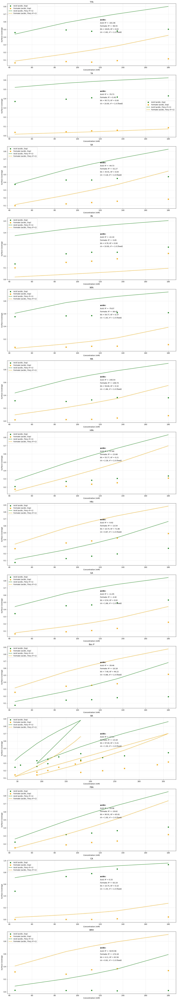

In [12]:
# Create DataFrame and display
flory_fixed_df = pd.DataFrame(flory_fixed_summary)
print("\nFlory Model (rF=1) Parameter and R² Summary:")
print(flory_fixed_df)

# Save the fixed Flory model results to CSV
flory_fixed_csv = 'flory_model_rF_fixed_parameter_summary.csv'
flory_fixed_df.to_csv(flory_fixed_csv, index=False)
print(f"\nFixed Flory model summary saved to {flory_fixed_csv}")

# Visualize the fixed Flory model fits - grouped by acid with conditions side by side
fig, axes = plt.subplots(len(acids), 1, figsize=(15, len(acids)*6))

# Handle the case of a single acid
if len(acids) == 1:
    axes = np.array([axes])

for i, acid in enumerate(acids):
    ax = axes[i]
    
    # Set title for the subplot
    ax.set_title(f"{acid}")
    ax.set_xlabel("Concentration (mM)")
    ax.set_ylabel("Surface Coverage")
    
    # Plot data for each condition
    for j, condition in enumerate(conditions):
        # Find the result for this acid and condition
        result = next((r for r in flory_fixed_results if r['Acid'] == acid and r['Condition'] == condition), None)
        
        if result:
            # Get the data
            data = df[(df['Acid'] == acid) & (df['Experiment'] == condition)]
            C_acid = data['Acid conc (mM)'].values
            C_formate = data['FA conc (mM)'].values
            theta_acid = data['acid/SBU'].values/6
            theta_formate = data['FA/SBU'].values/6
            
            # Get predicted values
            theta_A_pred = result['Predicted']['Acid']
            theta_F_pred = result['Predicted']['Formate']
            
            # Define colors and markers based on condition
            acid_color = 'blue' if condition == 'Acidic' else 'green'
            formate_color = 'red' if condition == 'Acidic' else 'orange'
            
            # Plot experimental data
            ax.scatter(C_acid, theta_acid, color=acid_color, marker='o', label=f'Acid ({condition}, Exp)')
            ax.scatter(C_formate, theta_formate, color=formate_color, marker='s', label=f'Formate ({condition}, Exp)')
            
            # Plot model predictions
            ax.plot(C_acid, theta_A_pred, color=acid_color, linestyle='-', label=f'Acid ({condition}, Flory rF=1)')
            ax.plot(C_formate, theta_F_pred, color=formate_color, linestyle='-', label=f'Formate ({condition}, Flory rF=1)')
            
            # Add R² values to the plot
            r2_acid = result['R²']['Acid']
            r2_formate = result['R²']['Formate']
            KA, KF, rA, rF = result['Parameters']
            
            # Position text based on condition
            y_offset = 0.95 if condition == 'Acidic' else 0.75
            x_pos = 0.05 if condition == 'Acidic' else 0.55
            
            ax.text(x_pos, y_offset, f"{condition}:", transform=ax.transAxes, fontsize=10, va='top', fontweight='bold')
            ax.text(x_pos, y_offset-0.05, f"Acid: R² = {r2_acid:.2f}", transform=ax.transAxes, fontsize=10, va='top')
            ax.text(x_pos, y_offset-0.10, f"Formate: R² = {r2_formate:.2f}", transform=ax.transAxes, fontsize=10, va='top')
            ax.text(x_pos, y_offset-0.15, f"KA = {KA:.2f}, KF = {KF:.2f}", transform=ax.transAxes, fontsize=10, va='top')
            ax.text(x_pos, y_offset-0.20, f"rA = {rA:.2f}, rF = {rF:.1f} (fixed)", transform=ax.transAxes, fontsize=10, va='top')
    
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


In [13]:
# Testing Fowler-Guggenheim model with wFF = wAF = 0
# This tests the model with no lateral interactions between formate-formate and acid-formate

# Get unique acids and conditions from the dataframe
acids = df['Acid'].unique()
conditions = df['Experiment'].unique()

# Define the model function with wFF = wAF = 0
def fg_model_no_ff_af_interaction(params, acid, condition, data):
    KA, KF, wAA = params
    wFF = 0  # Setting formate-formate interaction to zero
    wAF = 0  # Setting acid-formate interaction to zero
    
    # Get experimental data
    exp_data = data[(data['Acid'] == acid) & (data['Experiment'] == condition)]
    C_acid = exp_data['Acid conc (mM)'].values
    C_formate = exp_data['FA conc (mM)'].values
    theta_acid_exp = exp_data['acid/SBU'].values/6
    theta_formate_exp = exp_data['FA/SBU'].values/6
    
    # Calculate predicted values using Fowler-Guggenheim model
    theta_acid_pred, theta_formate_pred = competitive_fowler(
        C_acid, C_formate, KA, KF, wAA, wFF, wAF
    )
    
    # Calculate error
    error_acid = np.sum((theta_acid_exp - theta_acid_pred)**2)
    error_formate = np.sum((theta_formate_exp - theta_formate_pred)**2)
    total_error = error_acid + error_formate
    
    return total_error, theta_acid_pred, theta_formate_pred, theta_acid_exp, theta_formate_exp

# Fit the model for each acid and condition
results = {}
for i, acid in enumerate(acids):
    results[acid] = {}
    for condition in conditions:
        # Initial parameter guess
        initial_params = [1.0, 0.1, 0.0]  # KA, KF, wAA
        
        # Bounds for parameters
        bounds = [(0.01, 100), (0.01, 100), (-10, 10)]  # KA, KF, wAA
        
        # First try with 20 iterations
        try:
            result = differential_evolution(
                lambda params: fg_model_no_ff_af_interaction(params, acid, condition, df)[0],
                bounds,
                maxiter=20,
                popsize=15,
                tol=0.01
            )
            
            # If not converged, try with 200 iterations
            if not result.success:
                print(f"First attempt for {acid} in {condition} did not converge. Trying with 200 iterations.")
                result = differential_evolution(
                    lambda params: fg_model_no_ff_af_interaction(params, acid, condition, df)[0],
                    bounds,
                    maxiter=200,
                    popsize=15,
                    tol=0.01
                )
            
            # Get optimized parameters
            KA, KF, wAA = result.x
            
            # Calculate predicted values
            _, theta_acid_pred, theta_formate_pred, theta_acid_exp, theta_formate_exp = fg_model_no_ff_af_interaction(
                result.x, acid, condition, df
            )
            
            # Calculate R² values
            ss_res_acid = np.sum((theta_acid_exp - theta_acid_pred)**2)
            ss_tot_acid = np.sum((theta_acid_exp - np.mean(theta_acid_exp))**2)
            r2_acid = 1 - (ss_res_acid / ss_tot_acid) if ss_tot_acid != 0 else 0
            
            ss_res_formate = np.sum((theta_formate_exp - theta_formate_pred)**2)
            ss_tot_formate = np.sum((theta_formate_exp - np.mean(theta_formate_exp))**2)
            r2_formate = 1 - (ss_res_formate / ss_tot_formate) if ss_tot_formate != 0 else 0
            
            # Store results
            results[acid][condition] = {
                'Parameters': [KA, KF, wAA, 0, 0],  # KA, KF, wAA, wFF=0, wAF=0
                'Predicted': {
                    'Acid': theta_acid_pred,
                    'Formate': theta_formate_pred
                },
                'R²': {
                    'Acid': r2_acid,
                    'Formate': r2_formate
                },
                'Converged': result.success,
                'Iterations': result.nit
            }
            
            # Print results
            print(f"\nResults for {acid} in {condition} condition (wFF=wAF=0):")
            print(f"Converged: {result.success}, Iterations: {result.nit}")
            print(f"KA = {KA:.4f}, KF = {KF:.4f}, wAA = {wAA:.4f}")
            print(f"R² Acid = {r2_acid:.4f}, R² Formate = {r2_formate:.4f}")
            
        except Exception as e:
            print(f"Error fitting {acid} in {condition} condition: {e}")
            results[acid][condition] = None

# Print summary of all results
print("\n\nSummary of all fitting results (wFF=wAF=0):")
print("=" * 80)
for acid in acids:
    print(f"\n{acid}:")
    for condition in conditions:
        result = results[acid].get(condition)
        if result:
            KA, KF, wAA, _, _ = result['Parameters']
            r2_acid = result['R²']['Acid']
            r2_formate = result['R²']['Formate']
            print(f"  {condition}: KA = {KA:.4f}, KF = {KF:.4f}, wAA = {wAA:.4f}")
            print(f"    R² Acid = {r2_acid:.4f}, R² Formate = {r2_formate:.4f}")
            print(f"    Converged: {result['Converged']}, Iterations: {result['Iterations']}")
        else:
            print(f"  {condition}: Failed to fit")


Error fitting TFA in acidic condition: Fowler solver failed
Error fitting TFA in basic condition: Fowler solver failed
Error fitting TA in acidic condition: Fowler solver failed
Error fitting TA in basic condition: Fowler solver failed
Error fitting SA in acidic condition: Fowler solver failed
Error fitting SA in basic condition: Fowler solver failed
Error fitting PA in acidic condition: Fowler solver failed

Results for PA in basic condition (wFF=wAF=0):
Converged: True, Iterations: 1
KA = 92.3458, KF = 68.7492, wAA = 0.5194
R² Acid = 0.0000, R² Formate = 0.0000
Error fitting NFA in acidic condition: Fowler solver failed
Error fitting NFA in basic condition: Fowler solver failed
Error fitting MA in acidic condition: Fowler solver failed
Error fitting MA in basic condition: Fowler solver failed
Error fitting HPA in acidic condition: Fowler solver failed
Error fitting HPA in basic condition: Fowler solver failed
Error fitting HAc in acidic condition: Fowler solver failed
Error fitting H

# <span style="color: black; background-color: white; padding: 10px; font-size: 36px;">10. Human-dervied physical model</span>

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import minimize, differential_evolution
import warnings
warnings.filterwarnings('ignore')

def competitive_adjacent_interaction(C_acid, C_fa, KA, KB, b):
    """Adjacent Interaction competitive adsorption model
    
    Parameters:
    -----------
    C_acid : array-like
        Acid concentration (mM)
    C_fa : array-like
        Formate concentration (mM)
    KA : float
        Acid equilibrium constant
    KB : float
        Formate equilibrium constant
    b : float
        Adjacent interaction parameter
        
    Returns:
    --------
    thetaA, thetaB : tuple of arrays
        Surface coverage fractions for acid and formate
    """
    C_acid = np.asarray(C_acid)
    C_fa = np.asarray(C_fa)
    
    # Calculate terms for acid (A)
    KA_CA = KA * C_acid
    KB_CB = KB * C_fa
    
    # Calculate numerator and denominator terms
    num_A = (KA_CA)**3 * b**3 + 2*(KA_CA)**2*(KB_CB)*b + (KB_CB)**2*(KA_CA) + 2*(KA_CA)**2*b + (KA_CA) + 2*(KA_CA)*(KB_CB)
    
    num_B = (KB_CB)**3 + 2*(KB_CB)**2*(KA_CA) + (KA_CA)**2*(KB_CB)*b + 2*(KB_CB)**2 + (KB_CB) + 2*(KA_CA)*(KB_CB)
    
    denom = (KA_CA)**3*b**3 + 3*(KA_CA)**2*(KB_CB)*b + 3*(KB_CB)**2*(KA_CA) + 2*(KA_CA)**2*b + (KA_CA) + 4*(KA_CA)*(KB_CB) + (KB_CB)**3 + 2*(KB_CB)**2*b + (KB_CB)
    
    thetaA = num_A / denom
    thetaB = num_B / denom
    
    return thetaA, thetaB

def objective_function(params, acid_data, condition=None):
    total_error = 0
    KA, KB, b = params
    
    if condition is None:
        # Use all conditions
        conditions = acid_data['Experiment'].unique()
    else:
        # Use only the specified condition
        conditions = [condition]
    
    for cond in conditions:
        subset = acid_data[acid_data['Experiment'] == cond]
        C_acid = subset['Acid conc (mM)'].values
        q_acid = subset['acid/SBU'].values/6
        C_fa = subset['FA conc (mM)'].values
        q_fa = subset['FA/SBU'].values/6
        
        try:
            thetaA, thetaB = competitive_adjacent_interaction(C_acid, C_fa, KA, KB, b)
            
            # Calculate error
            error_acid = np.sum((q_acid - thetaA) ** 2)
            error_fa = np.sum((q_fa - thetaB) ** 2)
            total_error += error_acid + error_fa
            
        except Exception as e:
            print(f"Error in fitting: {str(e)}")
            return np.inf
    
    return total_error

# Load data
df = pd.read_csv("MOL_surface_adsorption_250427.csv")
df["Acid"] = df["Acid"].replace("HAC", "HAc")
print("Data shape:", df.shape)
print("\nFirst few rows:")
print(df.head())

# Fit parameters for each acid
fitted_params = {}
acids = df['Acid'].unique()

for acid in acids:
    acid_data = df[df['Acid'] == acid]
    print(f"\nFitting Adjacent Interaction model for {acid}")
    
    # Fit for each condition separately
    condition_params = {}
    for condition in acid_data['Experiment'].unique():
        print(f"  Fitting for condition: {condition}")
        condition_data = acid_data[acid_data['Experiment'] == condition]
        
        # Use differential evolution to find good initial parameters
        print(f"  Running differential evolution to find initial parameters for {condition}...")
        bounds = [(0.1, 100.0), (0.1, 100.0), (0.1, 10.0)]
        
        try:
            result = differential_evolution(
                lambda x: objective_function(x, condition_data, condition),
                bounds=bounds,
                strategy='best1bin',
                maxiter=100,
                popsize=15,
                tol=0.01,
                mutation=(0.5, 1.0),
                recombination=0.7
            )
            
            de_params = result.x
            print(f"  DE found initial parameters for {condition}: KA = {de_params[0]:.4f}, KB = {de_params[1]:.4f}, b = {de_params[2]:.4f}")
            
            # Refine with L-BFGS-B
            bounds = [(0, None), (0, None), (0, None)]  # All parameters should be positive
            
            result = minimize(
                objective_function,
                de_params,
                args=(condition_data, condition),
                bounds=bounds,
                method='L-BFGS-B',
                options={'maxiter': 1000}
            )
            
            if result.success:
                condition_params[condition] = result.x
                KA, KB, b = result.x
                print(f"  Successfully fitted model for condition {condition}")
                print(f"  Parameters: KA = {KA:.4f}, KB = {KB:.4f}, b = {b:.4f}")
            else:
                print(f"  Failed to fit model for condition {condition}")
                condition_params[condition] = de_params
                
        except Exception as e:
            print(f"  Error fitting model for condition {condition}: {str(e)}")
            continue
    
    # Store the condition-specific parameters
    fitted_params[acid] = condition_params



Data shape: (137, 6)

First few rows:
  Acid Experiment  Acid conc (mM)  FA conc (mM)  acid/SBU  FA/SBU
0  TFA     acidic           180.0          45.0      3.02    0.38
1  TFA     acidic           135.0          90.0      2.88    0.48
2  TFA     acidic           112.5         112.5      2.86    0.44
3  TFA     acidic            90.0         135.0      2.96    0.56
4  TFA     acidic            45.0         180.0      2.76    0.70

Fitting Adjacent Interaction model for TFA
  Fitting for condition: acidic
  Running differential evolution to find initial parameters for acidic...
  DE found initial parameters for acidic: KA = 92.6211, KB = 1.1796, b = 0.1000
  Successfully fitted model for condition acidic
  Parameters: KA = 5528.0877, KB = 0.0765, b = 0.0010
  Fitting for condition: basic
  Running differential evolution to find initial parameters for basic...
  DE found initial parameters for basic: KA = 33.7993, KB = 88.1113, b = 0.1000
  Successfully fitted model for condition basic
 

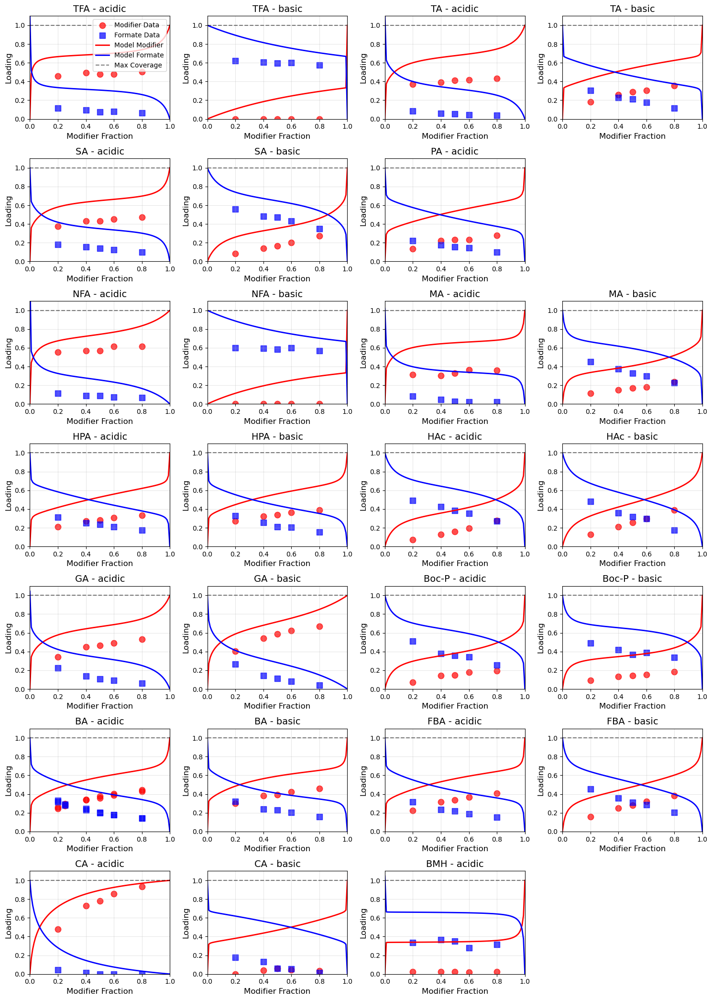

,Acid,Condition,KA,KB,b,R²_Acid,R²_Formate
0,TFA,acidic,5528.09,0.08,0.00,-208.77,-138.96
1,TFA,basic,50.71,81.67,0.00,-inf,-167.40
2,TA,acidic,93.41,0.07,0.01,-171.91,-244.37
3,TA,basic,4606.06,3.27,0.00,-19.29,-15.99
4,SA,acidic,38498.98,30.35,0.01,-40.84,-55.95
5,SA,basic,79.93,20.68,0.04,-7.41,-6.16
6,PA,acidic,6940.62,36.69,0.01,-43.36,-58.04
7,NFA,acidic,57.83,0.02,0.01,-38.10,-120.63
8,NFA,basic,49.55,71.34,0.00,-inf,-291.67
9,MA,acidic,4844.51,0.44,0.00,-160.03,-173.66



R² Values:

TFA:
  acidic condition:
    Acid R²: -208.77
    Formate R²: -138.96
  basic condition:
    Acid R²: -inf
    Formate R²: -167.40

TA:
  acidic condition:
    Acid R²: -171.91
    Formate R²: -244.37
  basic condition:
    Acid R²: -19.29
    Formate R²: -15.99

SA:
  acidic condition:
    Acid R²: -40.84
    Formate R²: -55.95
  basic condition:
    Acid R²: -7.41
    Formate R²: -6.16

PA:
  acidic condition:
    Acid R²: -43.36
    Formate R²: -58.04

NFA:
  acidic condition:
    Acid R²: -38.10
    Formate R²: -120.63
  basic condition:
    Acid R²: -inf
    Formate R²: -291.67

MA:
  acidic condition:
    Acid R²: -160.03
    Formate R²: -173.66
  basic condition:
    Acid R²: -34.46
    Formate R²: -9.99

HPA:
  acidic condition:
    Acid R²: -32.55
    Formate R²: -28.05
  basic condition:
    Acid R²: -29.70
    Formate R²: -11.99

HAc:
  acidic condition:
    Acid R²: -9.83
    Formate R²: -8.48
  basic condition:
    Acid R²: -4.73
    Formate R²: -3.36

GA:
  a

In [15]:
# Plot results
fig, axes = plt.subplots((len(acids) + 1) // 2, 4, figsize=(15, 21), dpi=100)
if len(axes.shape) == 1:
    axes = np.array([axes])

# Flag to track if legend has been added
legend_added = False

for i in range((len(acids) + 1) // 2):
    # Process even index acids (left columns)
    if 2*i < len(acids):
        acid = acids[2*i]
        acid_data = df[df['Acid'] == acid]
        conditions = acid_data['Experiment'].unique()
        
        for j in range(min(2, len(conditions))):
            condition = conditions[j]
            ax = axes[i, j]
            subset = acid_data[acid_data['Experiment'] == condition]
            
            # Calculate modifier fraction for experimental data
            total_conc = subset['Acid conc (mM)'] + subset['FA conc (mM)']
            modifier_fraction = subset['Acid conc (mM)'] / total_conc
            
            # Plot experimental data
            ax.scatter(modifier_fraction, subset['acid/SBU']/6, c='r', marker='o', alpha=0.7, s=80, label='Modifier Data')
            ax.scatter(modifier_fraction, subset['FA/SBU']/6, c='b', marker='s', alpha=0.7, s=80, label='Formate Data')
            
            # Plot model predictions
            if acid in fitted_params and condition in fitted_params[acid]:
                KA, KB, b = fitted_params[acid][condition]
                
                try:
                    # Calculate total concentration (constant sum)
                    avg_total_conc = np.mean(total_conc)
                    
                    # Create modifier fraction array for plotting
                    modifier_fraction_plot = np.linspace(0, 1, 100)
                    
                    # Calculate concentrations from fractions
                    C_acid_plot = modifier_fraction_plot * avg_total_conc
                    C_fa_plot = (1 - modifier_fraction_plot) * avg_total_conc
                    
                    # Calculate model predictions
                    thetaA, thetaB = competitive_adjacent_interaction(C_acid_plot, C_fa_plot, KA, KB, b)
                    
                    # Plot the curves
                    ax.plot(modifier_fraction_plot, thetaA, 'r-', linewidth=2, label='Model Modifier')
                    ax.plot(modifier_fraction_plot, thetaB, 'b-', linewidth=2, label='Model Formate')
                    
                    # Add a horizontal line at y=1 to show maximum coverage
                    ax.axhline(y=1.0, color='k', linestyle='--', alpha=0.5, linewidth=1.5, label='Max Coverage')
                    
                except Exception as e:
                    print(f"Error plotting model for {acid} ({condition}): {str(e)}")
            
            ax.set_xlabel('Modifier Fraction', fontsize=12)
            ax.set_ylabel('Loading', fontsize=12)
            ax.set_xlim(0, 1)  # Set x-axis from 0 to 1 for fraction
            ax.set_ylim(0, 1.1)  # Set y-axis limit to show max coverage
            ax.set_title(f'{acid} - {condition}', fontsize=14)
            
            # Only add legend to the first subplot
            if not legend_added:
                ax.legend(fontsize=10)
                legend_added = True
                
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='both', which='major', labelsize=10)
    
    # Process odd index acids (right columns)
    if 2*i+1 < len(acids):
        acid = acids[2*i+1]
        acid_data = df[df['Acid'] == acid]
        conditions = acid_data['Experiment'].unique()
        
        for j in range(min(2, len(conditions))):
            condition = conditions[j]
            ax = axes[i, j+2]  # Use columns 2 and 3 (right side)
            subset = acid_data[acid_data['Experiment'] == condition]
            
            # Calculate modifier fraction for experimental data
            total_conc = subset['Acid conc (mM)'] + subset['FA conc (mM)']
            modifier_fraction = subset['Acid conc (mM)'] / total_conc
            
            # Plot experimental data
            ax.scatter(modifier_fraction, subset['acid/SBU']/6, c='r', marker='o', alpha=0.7, s=80, label='Modifier Data')
            ax.scatter(modifier_fraction, subset['FA/SBU']/6, c='b', marker='s', alpha=0.7, s=80, label='Formate Data')
            
            # Plot model predictions
            if acid in fitted_params and condition in fitted_params[acid]:
                KA, KB, b = fitted_params[acid][condition]
                
                try:
                    # Calculate total concentration (constant sum)
                    avg_total_conc = np.mean(total_conc)
                    
                    # Create modifier fraction array for plotting
                    modifier_fraction_plot = np.linspace(0, 1, 100)
                    
                    # Calculate concentrations from fractions
                    C_acid_plot = modifier_fraction_plot * avg_total_conc
                    C_fa_plot = (1 - modifier_fraction_plot) * avg_total_conc
                    
                    # Calculate model predictions
                    thetaA, thetaB = competitive_adjacent_interaction(C_acid_plot, C_fa_plot, KA, KB, b)
                    
                    # Plot the curves
                    ax.plot(modifier_fraction_plot, thetaA, 'r-', linewidth=2, label='Model Modifier')
                    ax.plot(modifier_fraction_plot, thetaB, 'b-', linewidth=2, label='Model Formate')
                    
                    # Add a horizontal line at y=1 to show maximum coverage
                    ax.axhline(y=1.0, color='k', linestyle='--', alpha=0.5, linewidth=1.5, label='Max Coverage')
                    
                except Exception as e:
                    print(f"Error plotting model for {acid} ({condition}): {str(e)}")
            
            ax.set_xlabel('Modifier Fraction', fontsize=12)
            ax.set_ylabel('Loading', fontsize=12)
            ax.set_xlim(0, 1)  # Set x-axis from 0 to 1 for fraction
            ax.set_ylim(0, 1.1)  # Set y-axis limit to show max coverage
            ax.set_title(f'{acid} - {condition}', fontsize=14)
            
            # No legend for other subplots
            ax.grid(True, alpha=0.3)
            ax.tick_params(axis='both', which='major', labelsize=10)

# Hide any unused axes
for i in range((len(acids) + 1) // 2):
    for j in range(4):
        if ((j < 2 and 2*i >= len(acids)) or 
            (j >= 2 and 2*i+1 >= len(acids)) or
            (j < 2 and j >= len(df[df['Acid'] == acids[2*i]]['Experiment'].unique())) or
            (j >= 2 and 2*i+1 < len(acids) and j-2 >= len(df[df['Acid'] == acids[2*i+1]]['Experiment'].unique()))):
            axes[i, j].set_visible(False)

plt.tight_layout()
plt.show()

# Calculate R² values
r2_values = {}
for acid in acids:
    acid_data = df[df['Acid'] == acid]
    r2_values[acid] = {}
    
    for condition in acid_data['Experiment'].unique():
        condition_data = acid_data[acid_data['Experiment'] == condition]
        
        if acid in fitted_params and condition in fitted_params[acid]:
            KA, KB, b = fitted_params[acid][condition]
            
            try:
                # Calculate model predictions
                C_acid = condition_data['Acid conc (mM)'].values
                C_fa = condition_data['FA conc (mM)'].values
                thetaA, thetaB = competitive_adjacent_interaction(C_acid, C_fa, KA, KB, b)
                
                # Calculate R² for acid and formate
                r2_acid = 1 - np.sum((condition_data['acid/SBU']/6 - thetaA) ** 2) / np.sum((condition_data['acid/SBU']/6 - np.mean(condition_data['acid/SBU']/6)) ** 2)
                r2_fa = 1 - np.sum((condition_data['FA/SBU']/6 - thetaB) ** 2) / np.sum((condition_data['FA/SBU']/6 - np.mean(condition_data['FA/SBU']/6)) ** 2)
                
                if condition not in r2_values[acid]:
                    r2_values[acid][condition] = {}
                
                r2_values[acid][condition] = {'Acid': r2_acid, 'Formate': r2_fa}
                
            except Exception as e:
                print(f"Error calculating R² for {acid} ({condition}): {str(e)}")
                r2_values[acid][condition] = None

# Create a summary table
summary_data = []
for acid in acids:
    for condition in r2_values[acid]:
        if r2_values[acid][condition] is not None:
            KA, KB, b = fitted_params[acid][condition]
            summary_data.append({
                'Acid': acid,
                'Condition': condition,
                'KA': round(KA, 2),
                'KB': round(KB, 2),
                'b': round(b, 2),
                'R²_Acid': round(r2_values[acid][condition]['Acid'], 2),
                'R²_Formate': round(r2_values[acid][condition]['Formate'], 2)
            })

summary_df = pd.DataFrame(summary_data)

# Save summary to CSV
summary_df.to_csv('competitive_adsorption_summary.csv', index=False)

# Display formatted table
display(summary_df.style.format({
    'KA': '{:.2f}',
    'KB': '{:.2f}',
    'b': '{:.2f}',
    'R²_Acid': '{:.2f}',
    'R²_Formate': '{:.2f}'
}))

# Print R² values
print("\nR² Values:")
for acid in acids:
    print(f"\n{acid}:")
    for condition in r2_values[acid]:
        print(f"  {condition} condition:")
        if r2_values[acid][condition] is not None:
            print(f"    Acid R²: {r2_values[acid][condition]['Acid']:.2f}")
            print(f"    Formate R²: {r2_values[acid][condition]['Formate']:.2f}")

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import differential_evolution
from sklearn.metrics import r2_score # Use scikit-learn for R² calculation
import warnings

warnings.filterwarnings('ignore', category=RuntimeWarning) # Ignore warnings during calculation

print("--- Adsorption Ratio Model Fitting ---")

# --- 1. Define the Model Function ---
def calculate_ratio_model(concentration_ratio, K_tilde, b):
    """
    Calculates the adsorption ratio based on the provided formula.
    R_on = N_A / N_B
    x = C_A / C_B
    """
    x = np.asarray(concentration_ratio)
    K_tilde = np.maximum(K_tilde, 1e-12) # Ensure K_tilde > 0
    b = np.maximum(b, 1e-12) # Ensure b > 0
    
    Kx = K_tilde * x
    
    # Break down the formula for clarity and stability
    term1 = (Kx)**3 * b**3
    term2 = 2 * (Kx)**2 * b
    term3 = Kx
    numerator = term1 + term2 + term3
    
    term4 = 1.0
    term5 = 2 * Kx
    term6 = (Kx)**2 * b
    denominator = term4 + term5 + term6
    
    # Avoid division by zero
    denominator = np.maximum(denominator, 1e-12) 
    
    R_on_pred = numerator / denominator
    
    # Optional: Clip to prevent extremely large values if needed, though model should handle
    # R_on_pred = np.clip(R_on_pred, 0, 1e9) # Prevent potential overflow if ratios get huge
    
    return R_on_pred

# --- 2. Define the Objective Function ---
def objective_function_ratio(params, x_data, y_data):
    """
    Objective function for ratio model fitting (sum of squared errors).
    """
    K_tilde, b = params
    
    # Ensure parameters are physically meaningful (positive)
    if K_tilde <= 0 or b <= 0:
        return np.inf # Penalize non-physical parameters heavily
        
    y_pred = calculate_ratio_model(x_data, K_tilde, b)
    
    # Calculate error only for valid (non-NaN, non-inf) experimental data
    valid_idx = ~np.isnan(y_data) & ~np.isinf(y_data) & ~np.isnan(y_pred) & ~np.isinf(y_pred)
    
    if np.sum(valid_idx) == 0: # No valid points to compare
        return np.inf 
        
    error = np.sum((y_data[valid_idx] - y_pred[valid_idx]) ** 2)
    
    # Return inf if error becomes nan or inf
    if np.isnan(error) or np.isinf(error):
        return np.inf
        
    return error

# --- 3. Prepare Data ---
# Make a copy to avoid modifying the original DataFrame
df_ratio = df.copy()

# Define a small threshold to avoid division by zero
small_threshold = 1e-6

# Calculate concentration ratio (x = C_A / C_B)
df_ratio['concentration_ratio'] = df_ratio['Acid conc (mM)'] / np.maximum(df_ratio['FA conc (mM)'], small_threshold)

# Calculate experimental adsorption ratio (R_on = N_A / N_B)
df_ratio['experimental_R_on'] = df_ratio['acid/SBU'] / np.maximum(df_ratio['FA/SBU'], small_threshold)

# Filter out rows where denominators were zero/small or result is NaN/inf
df_ratio = df_ratio[
    (df['FA conc (mM)'] > small_threshold) & 
    (df['FA/SBU'] > small_threshold) &
    df_ratio['concentration_ratio'].notna() & 
    df_ratio['experimental_R_on'].notna() &
    np.isfinite(df_ratio['concentration_ratio']) &
    np.isfinite(df_ratio['experimental_R_on'])
].copy()

print(f"Prepared data for ratio fitting. Number of valid data points: {len(df_ratio)}")
print("Columns added: 'concentration_ratio', 'experimental_R_on'")
print(df_ratio[['Acid', 'Experiment', 'concentration_ratio', 'experimental_R_on']].head())


# --- 4. Fit Parameters using Differential Evolution ---
ratio_fitted_results = []
acids = df_ratio['Acid'].unique()
conditions = df_ratio['Experiment'].unique()

# Define bounds for the parameters [K_tilde, b]
# Adjust bounds based on expected ranges if known
bounds = [(1e-6, 1e4), (1e-6, 1e4)] 

for acid in acids:
    for condition in conditions:
        # Filter data for the specific acid and condition
        data_subset = df_ratio[(df_ratio['Acid'] == acid) & (df_ratio['Experiment'] == condition)]
        
        if data_subset.empty or len(data_subset) < 3: # Need sufficient points for fitting
            print(f"\nSkipping {acid} - {condition}: Not enough valid data points ({len(data_subset)})")
            continue
            
        print(f"\nFitting Ratio model for {acid} under {condition} conditions...")
        
        x_data = data_subset['concentration_ratio'].values
        y_data = data_subset['experimental_R_on'].values
        
        result_data = {
            'Acid': acid,
            'Condition': condition,
            'Parameters': None,
            'Success': False,
            'R2': np.nan,
            'Predicted_R_on': None,
            'Concentration_Ratio': x_data,
            'Experimental_R_on': y_data
        }
        
        try:
            # Use differential_evolution for global optimization
            opt_result = differential_evolution(
                objective_function_ratio,
                bounds=bounds,
                args=(x_data, y_data),
                strategy='best1bin', # Common strategy
                maxiter=500,       # Max iterations
                popsize=15,        # Population size
                tol=0.01,          # Tolerance for convergence
                mutation=(0.5, 1), # Mutation factor range
                recombination=0.7, # Recombination probability
                seed=42            # For reproducibility
            )
            
            result_data['Success'] = opt_result.success
            
            if opt_result.success:
                K_tilde_opt, b_opt = opt_result.x
                result_data['Parameters'] = {'K_tilde': K_tilde_opt, 'b': b_opt}
                print(f"Successfully fitted Ratio model for {acid} ({condition})")
                print(f"Parameters: K_tilde = {K_tilde_opt:.4f}, b = {b_opt:.4f}")
                
                # Calculate predictions and R²
                y_pred = calculate_ratio_model(x_data, K_tilde_opt, b_opt)
                result_data['Predicted_R_on'] = y_pred
                
                # Calculate R² using scikit-learn's r2_score for robustness
                try:
                    # Ensure no NaNs/Infs in prediction for R² calculation
                    valid_pred_idx = ~np.isnan(y_pred) & ~np.isinf(y_pred)
                    valid_exp_idx = ~np.isnan(y_data) & ~np.isinf(y_data)
                    common_valid_idx = valid_pred_idx & valid_exp_idx
                    
                    if np.sum(common_valid_idx) > 1: # Need at least 2 points for R²
                        r2 = r2_score(y_data[common_valid_idx], y_pred[common_valid_idx])
                        result_data['R2'] = r2
                        print(f"R² = {r2:.4f}")
                    else:
                        print("Not enough valid points to calculate R².")
                        result_data['R2'] = np.nan 
                except Exception as r2_err:
                     print(f"Error calculating R²: {r2_err}")
                     result_data['R2'] = np.nan
            else:
                print(f"Failed to fit Ratio model for {acid} ({condition}): {opt_result.message}")
                
        except Exception as e:
            print(f"Error fitting Ratio model for {acid} ({condition}): {str(e)}")
        
        ratio_fitted_results.append(result_data)

# --- 5. Create Summary Table --- 
ratio_summary_list = []
for result in ratio_fitted_results:
    if result['Success'] and result['Parameters']:
        ratio_summary_list.append({
            'Acid': result['Acid'],
            'Experiment': result['Condition'], # Use 'Experiment' for consistency
            'K_tilde': round(result['Parameters']['K_tilde'], 2),
            'b': round(result['Parameters']['b'], 2),
            'R2': round(result['R2'], 2)
        })
    else:
         # Add entry even if fit failed, showing NaNs
         ratio_summary_list.append({
            'Acid': result['Acid'],
            'Experiment': result['Condition'],
            'K_tilde': np.nan,
            'b': np.nan,
            'R2': np.nan
        })

# Filter out potential duplicates if skipped runs resulted in empty entries before append
valid_summary_entries = [entry for entry in ratio_summary_list if 'Acid' in entry]        
ratio_summary_df = pd.DataFrame(valid_summary_entries)

print("\nAdsorption Ratio Model Parameter and R² Summary:")
# Display with formatting
print(ratio_summary_df.to_string(float_format="%.2f"))

# Save the summary to CSV
ratio_summary_csv = 'adsorption_ratio_model_summary.csv'
ratio_summary_df.to_csv(ratio_summary_csv, index=False)
print(f"\nRatio model summary saved to {ratio_summary_csv}")


--- Adsorption Ratio Model Fitting ---
Prepared data for ratio fitting. Number of valid data points: 134
Columns added: 'concentration_ratio', 'experimental_R_on'
  Acid Experiment  concentration_ratio  experimental_R_on
0  TFA     acidic                 4.00               7.95
1  TFA     acidic                 1.50               6.00
2  TFA     acidic                 1.00               6.50
3  TFA     acidic                 0.67               5.29
4  TFA     acidic                 0.25               3.94

Fitting Ratio model for TFA under acidic conditions...
Successfully fitted Ratio model for TFA (acidic)
Parameters: K_tilde = 9923.2877, b = 0.0138
R² = -1.0382

Fitting Ratio model for TFA under basic conditions...
Successfully fitted Ratio model for TFA (basic)
Parameters: K_tilde = 0.0000, b = 0.0000
R² = 0.0000

Fitting Ratio model for TA under acidic conditions...
Successfully fitted Ratio model for TA (acidic)
Parameters: K_tilde = 9986.6234, b = 0.0174
R² = 0.0209

Fitting Rat


Visualizing Adsorption Ratio Model Fits...


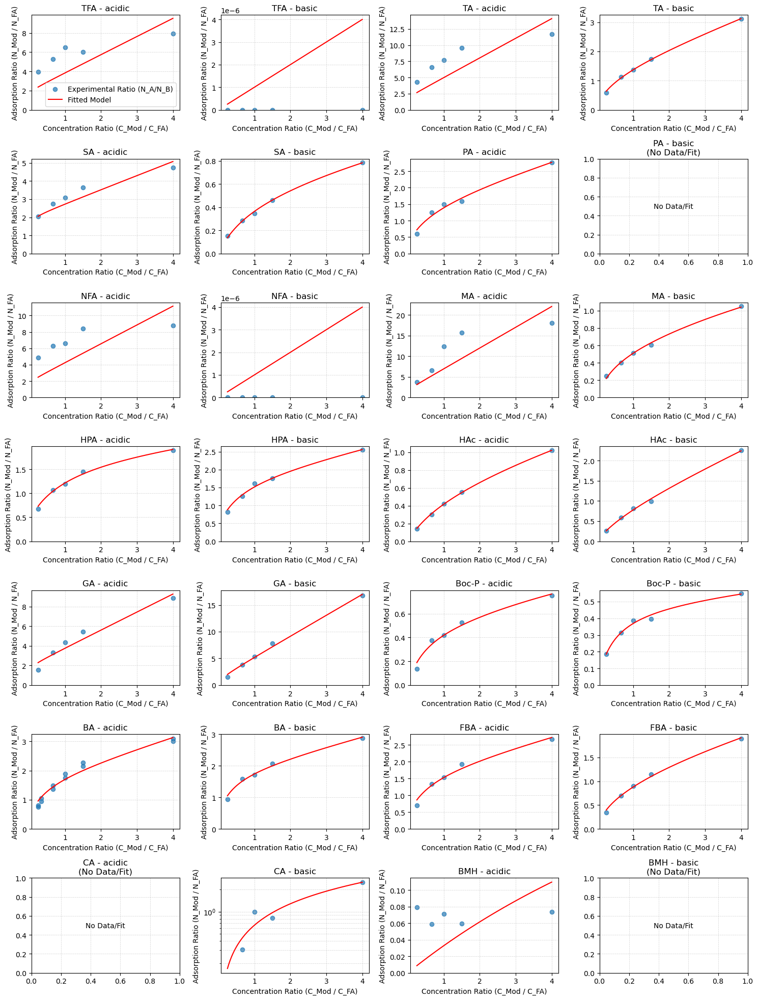

In [17]:
# --- 6. Plot Results --- 
print("\nVisualizing Adsorption Ratio Model Fits...")
n_acids = len(acids)
n_conditions = len(conditions)

# Arrange in 4 columns
n_cols = 4
n_rows = int(np.ceil(n_acids * n_conditions / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, 
                         figsize=(15, 21), 
                         squeeze=False, sharex=False, sharey=False)

# Flatten the axes for easier indexing
axes_flat = axes.flatten()

plot_idx = 0
for i, acid in enumerate(acids):
    for j, condition in enumerate(conditions):
        if plot_idx < len(axes_flat):
            ax = axes_flat[plot_idx]
            plot_idx += 1
            
            # Find the result for this acid and condition
            result = next((r for r in ratio_fitted_results if r['Acid'] == acid and r['Condition'] == condition), None)
            
            plot_title = f"{acid} - {condition}"
            
            if result and len(result['Concentration_Ratio']) > 0:
                x_exp = result['Concentration_Ratio']
                y_exp = result['Experimental_R_on']
                
                # Plot experimental data points
                ax.scatter(x_exp, y_exp, marker='o', alpha=0.7, label='Experimental Ratio (N_A/N_B)')
                
                # Plot model predictions if fit was successful
                if result['Success'] and result['Parameters']:
                    K_tilde = result['Parameters']['K_tilde']
                    b = result['Parameters']['b']
                    
                    # Generate smooth concentration ratios for plotting the curve
                    # Use log scale if x_exp spans orders of magnitude, otherwise linear
                    if np.max(x_exp) / np.maximum(np.min(x_exp), 1e-9) > 100: # Check if range is large
                         x_smooth = np.logspace(np.log10(np.maximum(np.min(x_exp), 1e-9)), np.log10(np.max(x_exp)), 100)
                         ax.set_xscale('log') # Use log scale for x-axis if appropriate
                    else:
                         x_smooth = np.linspace(np.min(x_exp), np.max(x_exp), 100)
                         ax.set_xscale('linear')

                    y_smooth = calculate_ratio_model(x_smooth, K_tilde, b)
                    
                    ax.plot(x_smooth, y_smooth, 'r-', label='Fitted Model')
                else:
                     plot_title += "\n(Fit Failed)"
                     
                ax.set_xlabel("Concentration Ratio (C_Mod / C_FA)")
                ax.set_ylabel("Adsorption Ratio (N_Mod / N_FA)")
                
                # Only add legend to the first subplot
                if plot_idx == 1:
                    ax.legend()
                
                # Set appropriate y-limits, maybe log scale if data spans orders of magnitude
                if np.nanmax(y_exp) / np.maximum(np.nanmin(y_exp), 1e-9) > 100:
                     ax.set_yscale('log')
                else:
                     ax.set_yscale('linear')
                     ax.set_ylim(bottom=0) # Start linear y-axis at 0
                     
            else:
                # Handle cases where there was no data or fit wasn't attempted
                 ax.text(0.5, 0.5, 'No Data/Fit', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
                 plot_title += "\n(No Data/Fit)"

            ax.set_title(plot_title)
            ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.6) # Grid for both major and minor ticks if log scale used

# Hide any unused subplots
for idx in range(plot_idx, len(axes_flat)):
    axes_flat[idx].set_visible(False)

plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Adjust layout to prevent title overlap
plt.show()